# Understanding Junctions (Chains, Forks and Colliders) and the Role they Play in Causal Inference

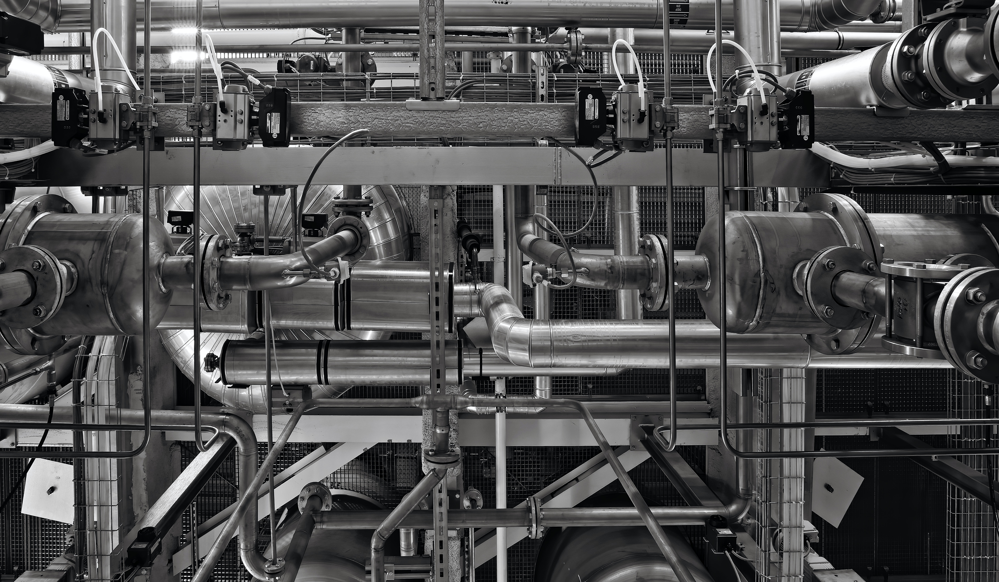
Photo by <a href="https://unsplash.com/@rgaleriacom?utm_content=creditCopyText&utm_medium=referral&utm_source=unsplash">Ricardo Gomez Angel</a> on <a href="https://unsplash.com/photos/stainless-steel-and-red-industrial-machine-41X6FwTwPh4?utm_content=creditCopyText&utm_medium=referral&utm_source=unsplash">Unsplash</a>

## Introduction

Causal inference is the application of probability, visualisation and machine learning in understanding the answer to the question “why?”. It is a relatively new field of data science and offers the potential to extend the benefits of predictive algorithms which address the symptoms of an underlying business problem to permanently curing the business problem by establishing cause and effect.

Typically Causal Inference will start with a dataset (like any other branch of dataset) and then augment the data with a visual representation of the causes and effects enshrined in the relationship between the data items. A common form of this visualisation is the Directed Acyclic Graph or DAG. 

### The Problem
DAGs look deceptively simple but they hide a lot of complexity which must be fully understand to maximise the application of causal inference techniques.

### The Opportunity
Even the most complex DAGs can be broken down into a collection of junctions which can only be one of 3 patterns - a chain, a fork or a collider - and once those patterns are explained the more complex techniques can be built up, understood and applied.

### The Way Forward
This article will take the time to fully explain and understand the 3 patterns of junction setting the foundations for the reader to understand the detail of complex causal inference techniques.

In [1]:
import pandas as pd
import numpy as np
#import copy

#from typing import Tuple

import matplotlib.pyplot as plt

#import json

from icecream import ic

#import pickle

#from statsmodels.formula.api import ols
#from statsmodels.regression.linear_model import RegressionResultsWrapper

In [2]:
import sys
sys.path.insert(1, r'C:\\Users\\GHarr\\OneDrive - Lincoln College\\Python Projects\Data Science\\ghlibrary')

import dataframe_tools # type: ignore
from dag_tools import DirectedAcyclicGraph # type: ignore
from causal_tools import CausalModel # type: ignore
from misc_tools import calculate_percentage_accuracy # type: ignore

## Background

We are going to need an example DAG to explore and explain. I have constructed the fictitious DAG below because it is sufficiently simple to effectively explore the concepts and sufficiently complex to contain examples of all 3 types of junctions ...

A complex DAG taken from 'Causal Inference in Statistics' that includes 5 colliders, 3 forks and a chain between the treatment and outcome 



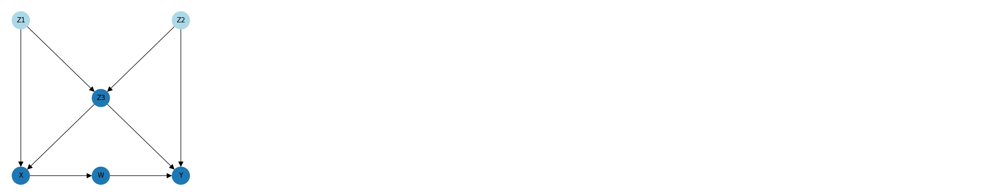

In [3]:
example_dag = DirectedAcyclicGraph.example_dags()["causal_inference_in_statistics_1"]
print(example_dag["description"], "\n")

dag: DirectedAcyclicGraph = example_dag["dag"]
dag.draw(grid_size=5)

This DAG represents the proposed causal relationships found within a dataset that contains 6 columns - X, Z1, Z2, Z3, W and Y. In all causal problems we are interested in the isolated effect of a treatment (in this case X) on an outcome (in this case Y).

The objective of causal inference is to establish the isolated effect of the treatment (X) and the outcome (Y) whilst adjusting for the effect of the other factors. For example in the proposed DAG Z3 is affecting both the treatment and the outcome and this would have to be accounted and adjusted for in any causal solution. 

"Treatment" and "effect" sound like medical terms and indeed the terminology is borrowed from the medical field as that is where a lot of the work originated. However it should be noted that Causal Inference is equally applicable to non-medical domains but by convention the terms "treatment" and "outcome" are used universally across all domains.

If you are wondering about the relationship between the DAG and the dataset, each node in the DAG represents a column in the data and each arrow is showing a proposed causal link i.e. data point X influences or causes data point W which in turn causes data point Y. The dataset for this DAG can be viewed as follows ...

In [4]:
causal_model: CausalModel = CausalModel(dag=dag, random_state=1)
causal_model.fit(X=None)
causal_model.data.head()

ic| 'CausalModel.fit'
ic| expr_str: 'Z3 = 3 x Z1 + -1.5 x Z2 + ε'
ic| expr_str: 'X = 2 x Z1 + 2.5 x Z3 + ε'
ic| expr_str: 'W = 3 x X + ε'
ic| expr_str: 'Y = 2 x W + 2 x Z2 + -3 x Z3 + ε'


,Z1,Z2,Z3,X,W,Y
0,3.844571,0.441614,12.794091,36.960446,115.415586,206.886397
1,2.907344,1.647342,4.678797,24.138748,82.681145,150.095276
2,6.241980,1.659767,16.349857,53.441608,193.360262,330.371609
3,0.793805,4.437415,-5.416621,-13.807977,-49.231954,-20.652048
4,7.754840,4.348612,16.867327,57.108005,171.713442,322.707828


The next concept is that there are many paths or routes through the DAG. Paths always start at the treatment, always end at the outcome and are acyclic (i.e. they do not loop back).

Given these concepts can you calculate how many possible paths exist in the example DAG?

The answer is 5 which can be visualised as follows ...

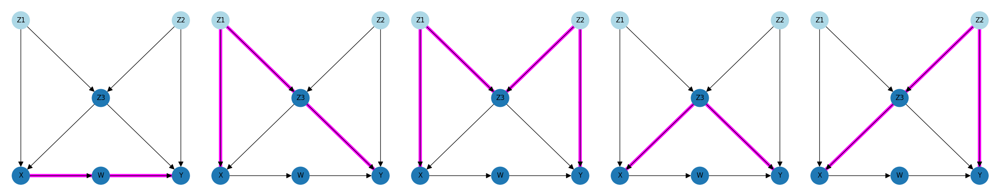

In [5]:
dag.draw_paths(paths=dag.all_paths(), cols=5)

It is also common to see paths represented in a flattened, textual form which can be confusing at first, but once explained they are very straightforward. The 5 paths shown visually above can be expressed in this form as follows ...

In [6]:
dag.print_paths(paths=dag.all_paths())

1) X -> W -> Y
2) X <- Z1 -> Z3 -> Y
3) X <- Z1 -> Z3 <- Z2 -> Y
4) X <- Z3 -> Y
5) X <- Z3 <- Z2 -> Y


The next step in understanding even the most complex DAGs is the concept of junctions. All DAGs and all paths within them are made up of junctions where each junction has exactly 3 nodes and 2 connections.

For example our first path (X -> W -> Y) is also a junction because it has exactly 3 nodes and exactly 2 connections.

Path 2 (X <- Z1 -> Z3 -> Y) is slightly more complicated; it contains 2 junctions - 

- X <- Z1 -> Z3
- Z1 -> Z3 -> Y

Path 3 (X <- Z1 -> Z3 <- Z2 -> Y) contains 3 junctions - 

- X <- Z1 -> Z3
- Z1 -> Z3 <- Z2
- Z3 <- Z2 -> Y

It is easy to understand the relationship between DAGs, paths and junctions by simply visualising all junctions in the example DAG ...

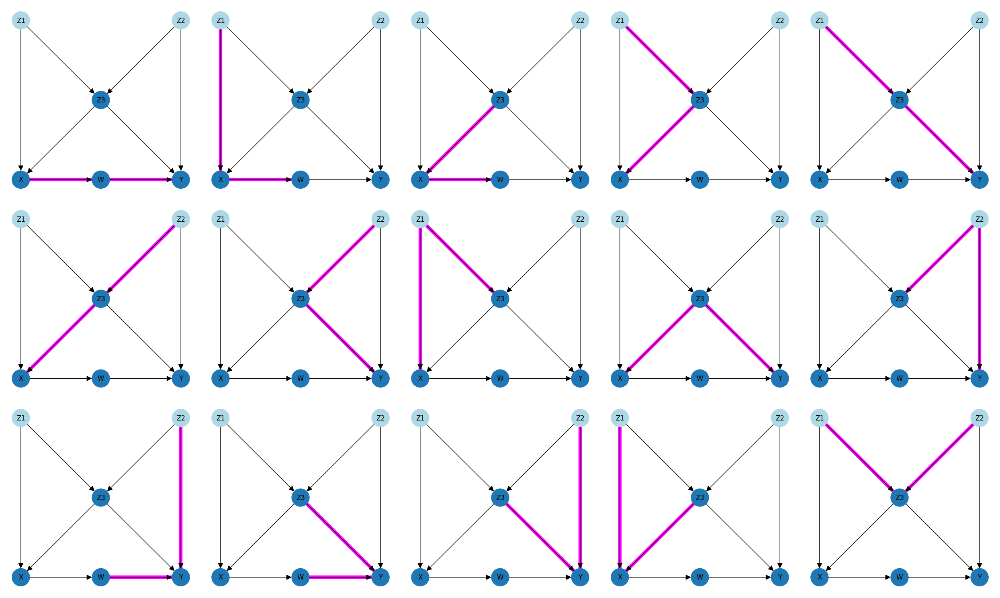

1) X -> W -> Y
2) Z1 -> X -> W
3) Z3 -> X -> W
4) Z1 -> Z3 -> X
5) Z1 -> Z3 -> Y
6) Z2 -> Z3 -> X
7) Z2 -> Z3 -> Y
8) X <- Z1 -> Z3
9) X <- Z3 -> Y
10) Y <- Z2 -> Z3
11) W -> Y <- Z2
12) W -> Y <- Z3
13) Z2 -> Y <- Z3
14) Z1 -> X <- Z3
15) Z1 -> Z3 <- Z2


In [7]:
dag.draw_paths(paths=dag.junctions, cols=5, print_paths=True)

It should be apparent from a quick review of all junctions within our DAG that there are just 3 possible patterns or types of junction.

Junction 1 (X -> W -> Y) is an example of a "chain" where the first node "points" to the intermediary (X -> W) and the intermediary "points" to the final node (W -> Y).
The

Junction 8 (X <- Z1 -> Z3) is an example of a "fork" where the intermediary node "points" to both the first node (X <- Z1) and the final node (Z1 -> X).

Junction 11 (W -> Y <- Z2) is an example of a "collider" where the first node "points" to the intermediary (W -> Y) and the final node also "points" to the intermediary (Y <- Z2).

It turns out that an understanding of these 3 patterns is critical to understanding many of the concepts of Causal Inference. 

For example Causal Validation is the process of validating the DAG against the dataset i.e. establishing if the proposed DAG is likely to be an accurate representation of the causal relationships between the columns in the data and the different behaviour of chains, forks and colliders is fundamental to understnading and implementing the calidation.

The remainder of this article is dedicated to exploring chains, forks and colliders in more details but before we get started let's take a short detour ...

## Detour: What Came First - The Chicken (The Data) or the Egg (The Directed Acyclic Graph)?

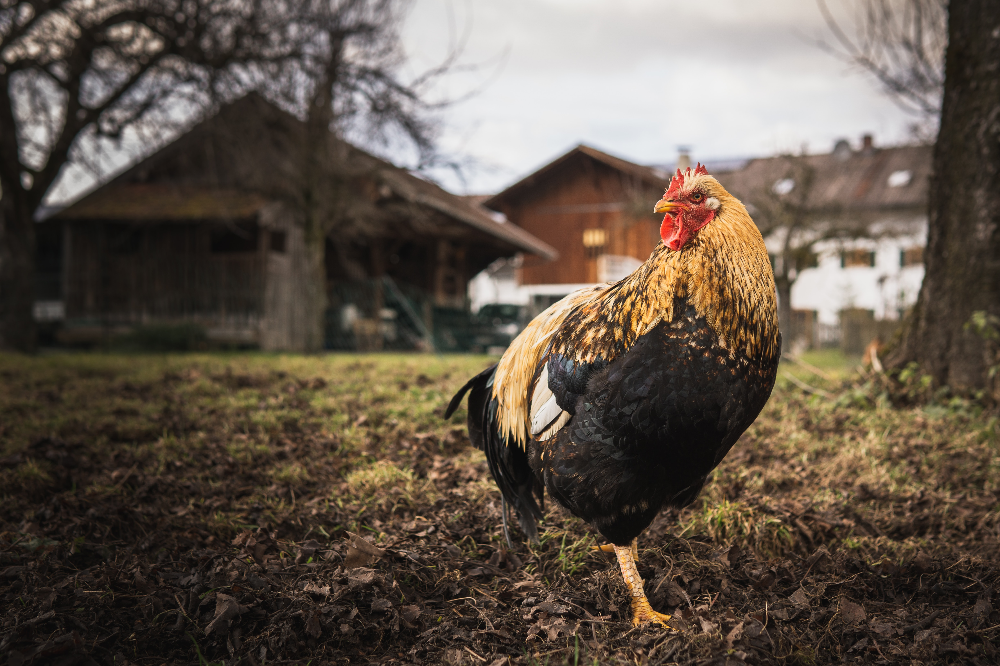
Photo by <a href="https://unsplash.com/@andretaissin?utm_content=creditCopyText&utm_medium=referral&utm_source=unsplash">Andre Taissin</a> on <a href="https://unsplash.com/photos/white-and-black-rooster-on-brown-soil-JXXRYrK2kGU?utm_content=creditCopyText&utm_medium=referral&utm_source=unsplash">Unsplash</a>

One thing that tends not to be clarified in the available literature is the relationship between the dataset and the Directed Acyclic Graph and because it is usually the opposite way round in real life problems to theoretical problems it can easily get confusing and prevent the reader from understanding the key points.

Real-world Causal Inference problems are just an extension of more traditional machine learning problems (like classification or regression) but in Causal Inference we are interested in not just predicting what may happen but understanding why it happened in the first place.

Causal Inference problems therefore always start with a dataset, just like any other machine learning project. In order to answer the "why?" type problems the dataset must be associated with a Directed Acyclic Graph that captures and visualises the causal relationships that exist in the data and the DAG is usually created through an iterative refinement process involving data scientists asking the right questions and domain experts answering using their expertise. 

At some stage a refinement of the DAG will have been produced that all parties are happy with and then the process of solving Causal Inference problems begins.

It should also be noted that some automation can be brought to bear in the process of creating a DAG from a dataset. <b>Causal Discovery</b> is the concept of automatically generating a DAG from the data and <b>Causal Validation</b> is the process of testing a DAG against a dataset. It is typically possible for more than one DAG to satisfy the Causal Inference validation tests against a give dataset so these approaches are complex and uncertain. I will return to these concepts in future articles, but it is worth noting their existence as part of this explanation.

In theoretical Causal Infrence problems (like the ones in this article) the exact opposite is the case. This type of problem typically starts with the DAG like the 6-node example used throughout this article with the data scientist(s) selecting a DAG that can be used to illustrate the points or execute the tests?

So where does the data come from in theoretical CI problems when the DAG comes first? The data scientists(s) involved create a synthetic data set that matches the DAG and it turns out this can be done very easily by following these steps ...

1. Start with the fictitous / test DAG that requires an associated dataset ...

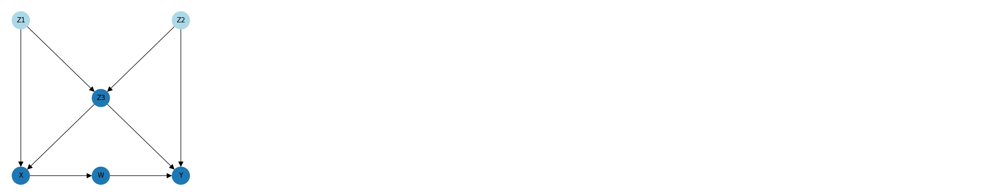

In [8]:
dag.draw(grid_size=5)

2. Attach a weigthing to each arrow on the DAG (the weightings can be selected at random)...

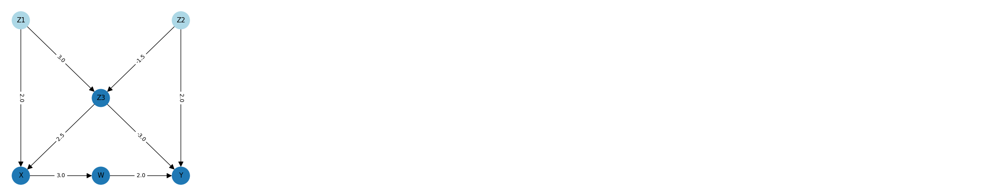

In [9]:
dag.draw(grid_size=5, labels=causal_model.edge_weightings)

3. Create a "structural equation" for each node by considering all of the incoming arrows and their associated weigthings ...

In [10]:
for key, structural_equation in causal_model.structural_equations.items():
    print(structural_equation)

Z1 = np.random.normal(4.753198042323167, 1.720324493442158)
Z2 = np.random.normal(3.289942920829799, 1.8849665188380633)
Z3 = 3 x Z1 + -1.5 x Z2 + ε
X = 2 x Z1 + 2.5 x Z3 + ε
W = 3 x X + ε
Y = 2 x W + 2 x Z2 + -3 x Z3 + ε


$$
Z1 \sim \mathcal{N}(4.75, 1.82^2) \\
Z2 \sim \mathcal{N}(3.29, 1.88^2) \\ 
$$

$$
Z3 = 3Z1 - 1.5Z2 + ε \\
X = 2Z1 + 2.5Z3 + ε \\
W = 3X + ε \\
Y = 2W + 2Z2 - 3Z3 + ε
$$

To complete the explanation all that is required is to understand the distinction between exogenous nodes / variables and endogenous variables / nodes. Exogenous nodes have no incoming causal arrows so in the example DAG the exogenous variables are Z1 and Z2 and the endogenous variables are X, W, Y and Z3. Exogenous variables must be assigned values randomly, usually by following a rule on a distribution.

The 6 structural equations (one for each node on the DAG) can therefore be fully explained and understood as follows ..

- Z1 is an exogenous variable (i.e. it has no inputs) that is normally distributed with a mean of 4.75 and a standard deviation of 1.82
- Z2 is an exogenous variable that is normally distributed with a mean of 3.29 and a standard deviation of 1.88

- Z3 = 3 X Z1 - 1.5 x Z2 + an error term
- X = 2 x Z1 + 2.5 x Z3 + an error term
- W = 3 x X + an error term
- Y = 2 x W + 2 x Z2 - 3 x Z3 + an error term

4. Generate the Data

Armed with this understanding it is very straightforward to write a few lines of Python to generate a dataset that exactly matches the test DAG where the causal relationships are described by the structural equations ...

Note that if ``np.random.seed(seed=...)`` is set the same data set will be generated each time the code is run, however if it is not set the dataset will be different each time (though each dataset generated will still be described by the structural equations and will match the DAG).

In [11]:
n=1000
df_test = pd.DataFrame()

np.random.seed(1)

df_test["Z1"] = np.random.normal(loc=4.753198042323167, scale=1.720324493442158, size=n)
df_test["Z2"] = np.random.normal(loc=3.289942920829799, scale=1.8849665188380633, size=n)

df_test["Z3"] = 3 * df_test["Z1"] - 1.5 * df_test["Z2"] 
error_terms = np.random.normal(loc=0, scale=df_test["Z3"].std()/4, size=n)
df_test["Z3"] += error_terms

df_test["X"] = 2 * df_test["Z1"] + 2.5 * df_test["Z3"] 
error_terms = np.random.normal(loc=0, scale=df_test["X"].std()/4, size=n)
df_test["X"] += error_terms

df_test["W"] = 3 * df_test["X"]
error_terms = np.random.normal(loc=0, scale=df_test["W"].std()/4, size=n)
df_test["W"] += error_terms

df_test["Y"] = 2 * df_test["W"] + 2 * df_test["Z2"] - 3 * df_test["Z3"] 
error_terms = np.random.normal(loc=0, scale=df_test["Y"].std()/4, size=n)
df_test["Y"] += error_terms

df_test

,Z1,Z2,Z3,X,W,Y
0,7.547599,3.001098,18.849516,61.877646,183.687041,294.732626
1,3.700778,-1.295254,13.390771,41.798499,127.359007,238.927669
2,3.844571,4.247476,4.514050,23.340019,74.344729,116.672140
3,2.907344,2.679153,3.819439,21.705897,75.779156,128.142202
4,6.241980,0.441614,15.126045,52.637599,166.012475,302.428980
...,...,...,...,...,...,...
995,4.552876,3.645415,7.073526,26.232212,100.939701,193.316114
996,0.835507,4.347255,-4.915390,-14.868783,-36.751659,-61.463007
997,4.633421,1.552646,11.353279,33.914154,90.985310,134.501006
998,5.361970,4.510223,7.294643,31.742129,110.265684,188.822793


In [12]:
causal_model.data

,Z1,Z2,Z3,X,W,Y
0,3.844571,0.441614,12.794091,36.960446,115.415586,206.886397
1,2.907344,1.647342,4.678797,24.138748,82.681145,150.095276
2,6.241980,1.659767,16.349857,53.441608,193.360262,330.371609
3,0.793805,4.437415,-5.416621,-13.807977,-49.231954,-20.652048
4,7.754840,4.348612,16.867327,57.108005,171.713442,322.707828
...,...,...,...,...,...,...
995,4.633421,5.904063,5.465877,23.658204,79.602500,125.114282
996,5.361970,4.212665,9.212642,31.732316,89.867887,194.437821
997,4.431575,3.740065,9.770078,34.221805,121.876436,241.395009
998,4.489582,2.445267,8.361504,32.488949,85.694711,98.286147


Once examples have been provided and worked through it is easy to understand the difference between real-world CI problems where the data has been collected first and the DAG dveloped by experts second, and theoretical / example CI problems where the test DAG is created first and then the test data engineered to match the DAG afterwards.

However, this explanation is often skipped in many of the available texts books and online articles which will lead to a lack of understanding of everything that follows.

Now this detour is complete, let's progress to an in-depth exploration of chains, forks and colliders.

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

In [13]:
random_seed = 100

def create_display_model(dag_name: str, display_results: bool = True) -> CausalModel:
    """Create and display a model frm the collection of example DAGs

    Args:
        dag_name (str): The name of the DAG in example dags

    Returns:
        CausalModel: A causal model built using the named example DAG containing fitted example data
    """
    # Extract the example DAG and draw it
    dag = DirectedAcyclicGraph.example_dags()[dag_name]["dag"]

    global random_seed
    random_seed+=1

    # Instantiate a causal model based on the named DAG and fit it with auto-generated test data
    causal_model = CausalModel(dag=dag, random_state=random_seed)
    causal_model.fit(X = None)

    if display_results:
        dag.draw(grid_size=5, labels=causal_model.edge_weightings)
        plt.show()

        display(causal_model.data)

        # Draw a 4-way scatter of the single junction represented by the DAG (as those chosen in this notebook are all single-junction DAGs)
        causal_model.scatter_junction(junction = dag.junctions[0])
        plt.show()

    return causal_model # Return the causal model

## Chains

Let's start by reviewing a visualisation of a chain ...


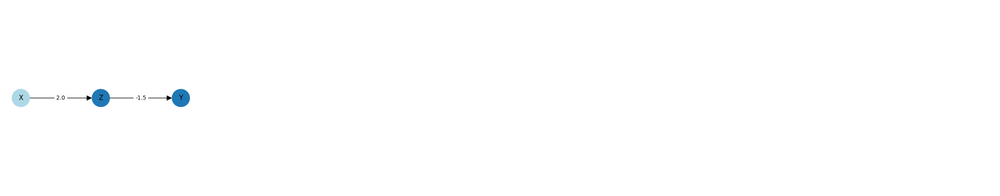

In [14]:
ic.disable()

chain_causal_model = create_display_model("simple_chain", display_results=False)
chain_causal_model.dag.draw(grid_size=5, labels=chain_causal_model.edge_weightings)

The "chain" is the most straightforward pattern for a junction and is easy to understand. In our example "X" is the "treatment" variable, "Y" is the outcome and "Z" is the intermediary. To provide an example X represents the amount of a drug that was taken in a trial, Z represents the affect the drug had on the patients blood pressure and Y represents the change in patient outcome.

In the literature we are told that in a chain messages can pass from X to Y but when I first read the literature I did not understand what this meant. There was no explanation of what a message was or how it might be passed from the treatment to the outcome.

Put simply the definition of message passing is that if the value of variable X changes then the value of Y is changed and whilst this can be a difficult concept there are 4 different ways to visualise this defintion which when considered together provide a comprehensive explanation.

### Using Maths

In our example Z = 2X and Y = -1.5Z and these two equations can be solved using substitution as follows -

$$
\begin{array}{l}
⓵ \ Z = 2X \\

⓶ \ Y = -1.5Z \\ \\

Y = -1.5 \times 2X \ \ \ \text{(taking equation ⓶ and substituting Z for 2X from equation ⓵)} \\
Y = -3X
\end{array}
$$

This also makes intuitive sense from the DAG above because the 2 weightings on the arrows are just multiplied together to reveal the effect of changing X on Y.

The maths can be validated by creating a calculated column in the data by multiplying X by -3. The calculated column can then be compared to the value for Y noting that the structural equations include error terms so the calculated column should be close to the value of Y but will never be an exact match ...

In [15]:
test_data = chain_causal_model.data.copy(deep=True)
test_data["X * -3"] = test_data["X"] * -3
test_data["difference"] = abs(test_data["X * -3"] - test_data["Y"])
test_data

,X,Z,Y,X * -3,difference
0,7.073706,14.421021,-21.895914,-21.221117,0.674796
1,6.438930,11.780809,-19.997919,-19.316791,0.681128
2,6.670278,13.736251,-18.506942,-20.010833,1.503891
3,5.146045,10.285976,-12.651194,-15.438135,2.786941
4,4.315541,7.469024,-11.660516,-12.946622,1.286106
...,...,...,...,...,...
995,5.959337,12.859272,-17.551811,-17.878011,0.326199
996,6.662308,12.689145,-19.714022,-19.986923,0.272901
997,5.080409,9.902116,-15.474873,-15.241228,0.233645
998,6.671077,13.330932,-19.486743,-20.013232,0.526489


### Using Correlation

If there is an association between X and Y then this should be clearly visible if we plot the data points for X on the X axis against the data points for Y on the Y axis and also the line that best fits those datapoints should have a co-efficient that matches our calculated value for the effect of X on Y ...

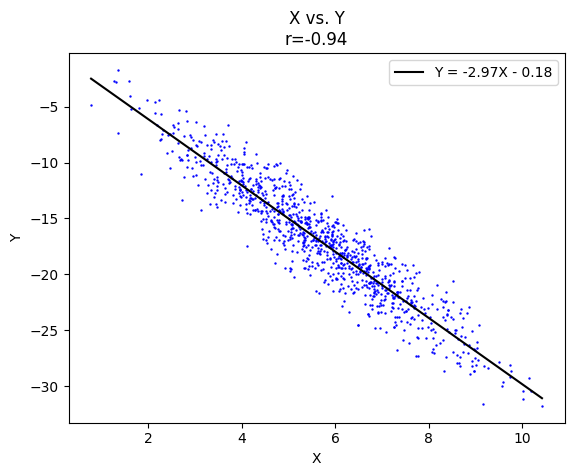

In [18]:
chain_causal_model.scatter_treatment_outcome(title="X vs. Y\n")

The scatter chart of X vs. Y confirms the maths and the co-efficient of the line is -2.97 which is very close to the result from the maths of -3 noting again that the presence of error terms in the structural equations that were used to generate the data mean they will never match exactly.

### Using Dependence

In a recent article I explained and explored the concept of dependence and why it is important in causal inference and causal validation - 

https://towardsdatascience.com/demystifying-dependence-and-why-it-is-important-in-causal-inference-and-causal-validation-4263b18d5f04

That understnading leads to another notation for expressing the reationship between X and Y in the chain junction ...

$$
% \perp is the ⊥ symbol, \!\!\! reverses 3 intervals and overlays another ⊥ giving ⫫
% \perp is ⊥ symbol then \!\!\!\!\!\! reverses 6 intervals, / is a sepeartor and finaly \ adds the slash giving ⫫̸
\providecommand{\independent}{\perp \!\!\! \perp}
\providecommand{\dependent}{\independent \!\!\!\!\!\! / \ }
\providecommand{\independentsingle}{\perp}
\providecommand{\dependentsingle}{\perp \!\!\!\!\!\! / \ }
\providecommand{\given}{\mid}
$$

$$
Y \dependent X
$$

... which can be read as "Y is dependent on X" (the ⫫̸ symbol is a "slashed double up-tack" and is used to represent dependence)

In [24]:
is_dependent_on_conditioned, _, ols_results = chain_causal_model.data.dependence(expression="Y ⫫̸ X | Z")
is_dependent_on_unconditioned, _, ols_results = chain_causal_model.data.dependence(expression="Y ⫫̸ X")

is_dependent_on_unconditioned


True

### Using Regression

The final method of highlighting the relationship between between X and Y is to perform an Ordinary Least Squares (OLS) regression and to see if the relationship exists in the output.

To implement this for our chain it is a simple matter of regresing on Y ~ X using the following Python code ...

In [25]:
df_data = chain_causal_model.data

In [26]:
from statsmodels.formula.api import ols

ols_formula = "Y ~ X"
ols_results = ols(ols_formula, df_data).fit()

ols_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      Y   R-squared:                       0.877
Model:                            OLS   Adj. R-squared:                  0.877
Method:                 Least Squares   F-statistic:                     7129.
Date:                Thu, 04 Jan 2024   Prob (F-statistic):               0.00
Time:                        08:39:16   Log-Likelihood:                -2022.9
No. Observations:                1000   AIC:                             4050.
Df Residuals:                     998   BIC:                             4060.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.1767      0.208     -0.850      0.396      -0.585       0.231
X             -2.9658      0.035    -84.431      0.000      -3.035      -2.897
==============================================================================
Omnibus:                        5.860   Durbin-Watson:                   1.963
Prob(Omnibus):                  0.053   Jarque-Bera (JB):                5.952
Skew:                          -0.185   Prob(JB):                       0.0510
Kurtosis:                       2.919   Cond. No.                         21.8
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

We can see from the results that the co-efficient of the line describing the effect of X on Y is -2.9658 which was plotted on the correlation above.

## Detour: The Effect of Conditioning on Z



In [20]:
is_dependent_on_unconditioned

True

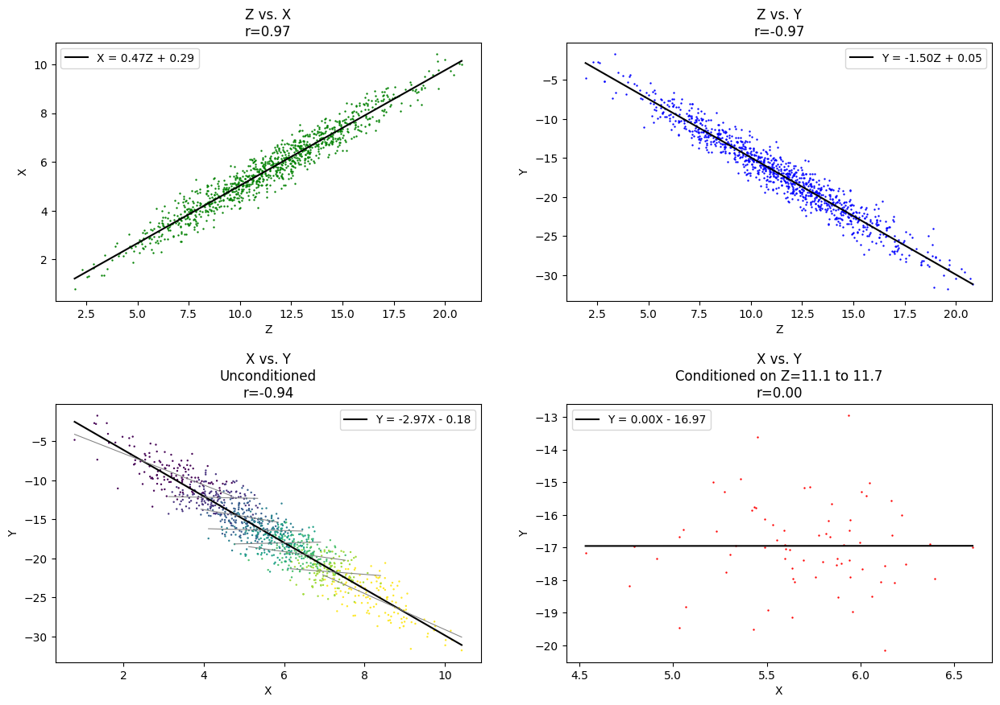

In [38]:
chain_causal_model.scatter_junction(junction = chain_causal_model.dag.junctions[0])

In [34]:
chain_causal_model.structural_equations

{'X': 'X = np.random.normal(1.7536593150674396, 1.3335062924790009)',
 'Z': 'Z = -2.5 x X + ε',
 'Y': 'Y = 2.5 x Z + ε'}

In [35]:
chain_causal_model.data

,X,Z,Y
0,0.784510,-1.837694,-7.577104
1,1.832824,-5.013857,-15.236423
2,3.094607,-6.756992,-20.021832
3,1.582784,-2.822993,-9.817973
4,-0.291929,1.683369,-0.576740
...,...,...,...
995,0.537635,-1.890525,-7.160484
996,0.268087,-1.975086,-4.640736
997,2.166669,-5.911836,-12.553538
998,2.006250,-3.477333,-5.097719


Chains


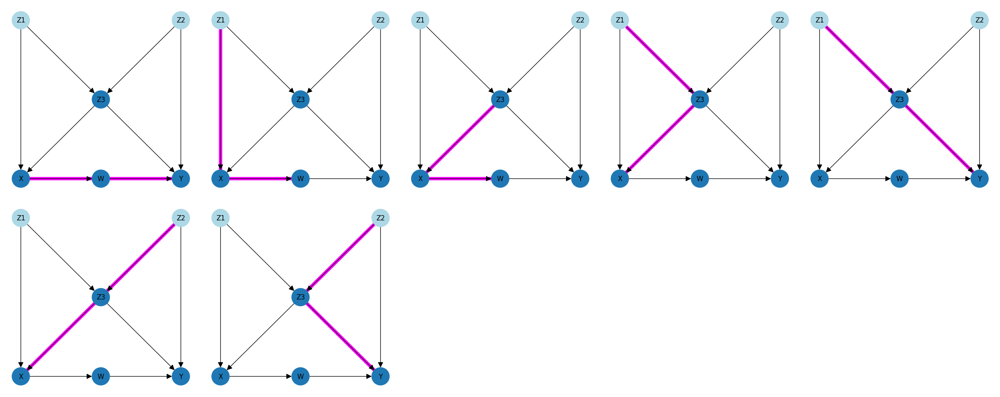

1) X -> W -> Y
2) Z1 -> X -> W
3) Z3 -> X -> W
4) Z1 -> Z3 -> X
5) Z1 -> Z3 -> Y
6) Z2 -> Z3 -> X
7) Z2 -> Z3 -> Y

Forks


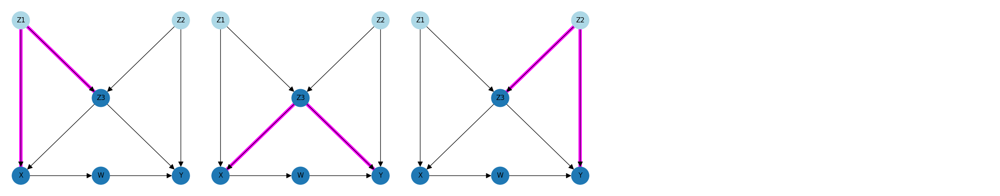

1) X <- Z1 -> Z3
2) X <- Z3 -> Y
3) Y <- Z2 -> Z3

Colliders


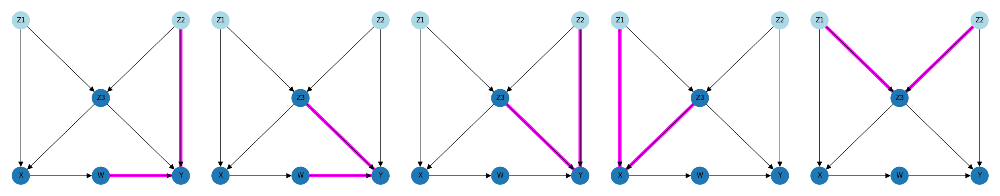

1) W -> Y <- Z2
2) W -> Y <- Z3
3) Z2 -> Y <- Z3
4) Z1 -> X <- Z3
5) Z1 -> Z3 <- Z2



In [25]:
dag.draw_junctions(cols=5, print_paths=True)

A complex DAG taken from 'Causal Inference in Statistics' that includes 5 colliders, 3 forks and a chain between the treatment and outcome 

Chains


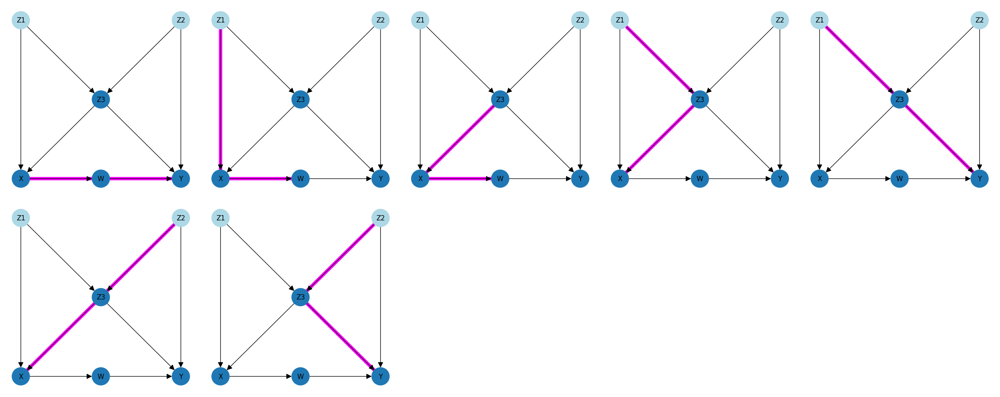

1) X -> W -> Y
2) Z1 -> X -> W
3) Z3 -> X -> W
4) Z1 -> Z3 -> X
5) Z1 -> Z3 -> Y
6) Z2 -> Z3 -> X
7) Z2 -> Z3 -> Y

Forks


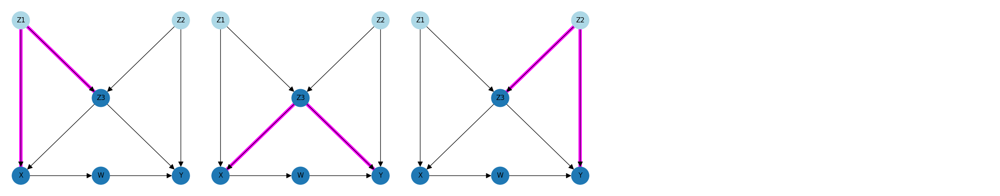

1) X <- Z1 -> Z3
2) X <- Z3 -> Y
3) Y <- Z2 -> Z3

Colliders


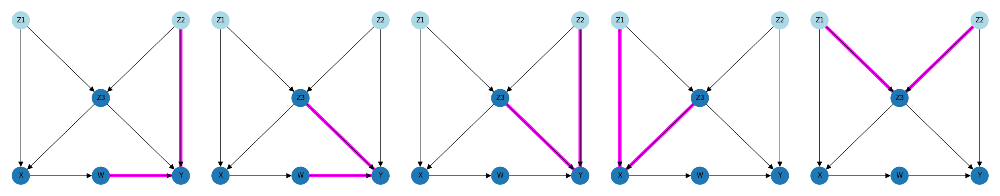

1) W -> Y <- Z2
2) W -> Y <- Z3
3) Z2 -> Y <- Z3
4) Z1 -> X <- Z3
5) Z1 -> Z3 <- Z2



In [3]:
example_dag = DirectedAcyclicGraph.example_dags()["causal_inference_in_statistics_1"]
print(example_dag["description"], "\n")

dag: DirectedAcyclicGraph = example_dag["dag"]
dag.draw_junctions(cols=5, print_paths=True)

In [4]:
random_seed = 100

def create_display_model(dag_name: str, display_results: bool = True) -> CausalModel:
    """Create and display a model frm the collection of example DAGs

    Args:
        dag_name (str): The name of the DAG in example dags

    Returns:
        CausalModel: A causal model built using the named example DAG containing fitted example data
    """
    # Extract the example DAG and draw it
    dag = DirectedAcyclicGraph.example_dags()[dag_name]["dag"]

    global random_seed
    random_seed+=1

    # Instantiate a causal model based on the named DAG and fit it with auto-generated test data
    causal_model = CausalModel(dag=dag, random_state=random_seed)
    causal_model.fit(X = None)

    if display_results:
        dag.draw(grid_size=5, labels=causal_model.edge_weightings)
        plt.show()

        display(causal_model.data)

        # Draw a 4-way scatter of the single junction represented by the DAG (as those chosen in this notebook are all single-junction DAGs)
        causal_model.scatter_junction(junction = dag.junctions[0])
        plt.show()

    return causal_model # Return the causal model

ic| 'CausalModel.fit'
ic| expr_str: 'Z = 2 x X + ε'
ic| expr_str: 'Y = -1.5 x Z + ε'


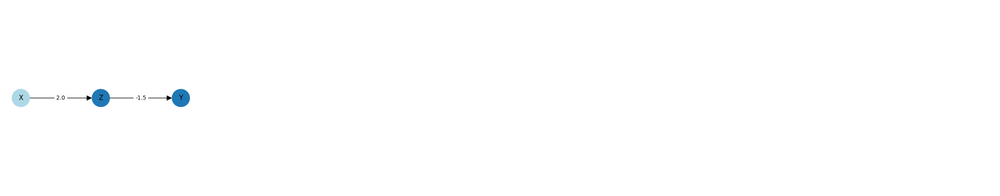

,X,Z,Y
0,7.073706,14.421021,-21.895914
1,6.438930,11.780809,-19.997919
2,6.670278,13.736251,-18.506942
3,5.146045,10.285976,-12.651194
4,4.315541,7.469024,-11.660516
...,...,...,...
995,5.959337,12.859272,-17.551811
996,6.662308,12.689145,-19.714022
997,5.080409,9.902116,-15.474873
998,6.671077,13.330932,-19.486743


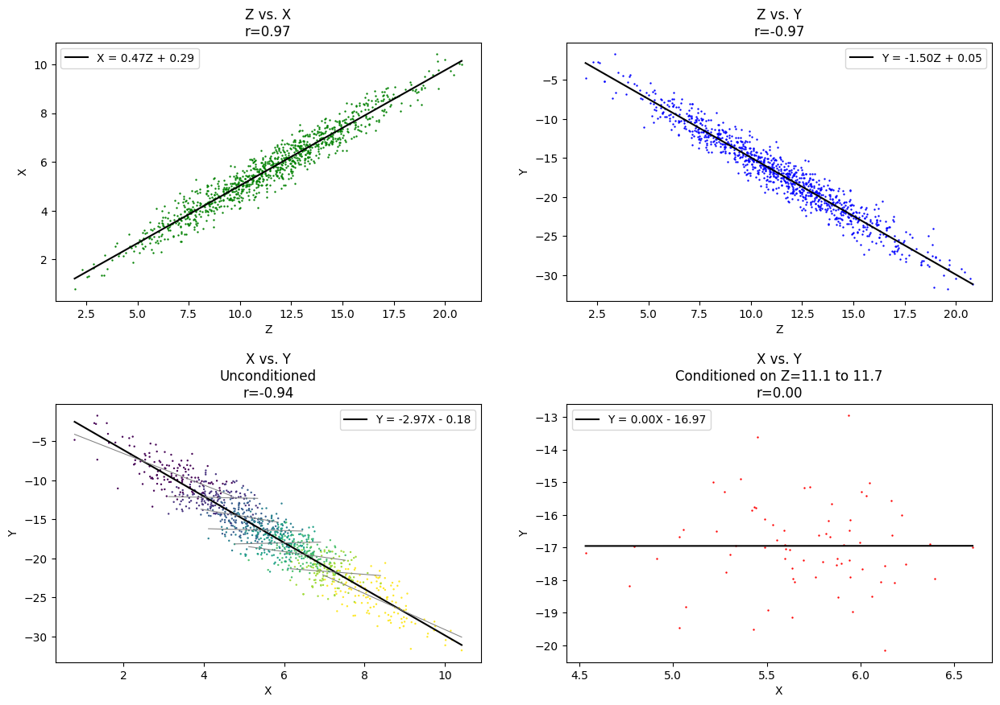

In [5]:
fork_causal_model = create_display_model("simple_chain")

In [6]:
fork_causal_model.structural_equations

{'X': 'X = np.random.normal(5.647587649322015, 1.5706675868681397)',
 'Z': 'Z = 2 x X + ε',
 'Y': 'Y = -1.5 x Z + ε'}

In [7]:
fork_causal_model.edge_weightings

{('X', 'Z'): 2.0, ('Z', 'Y'): -1.5}

In [8]:
for edge, edge_weighting in fork_causal_model.edge_weightings.items():
    print(edge, edge_weighting)


('X', 'Z') 2.0
('Z', 'Y') -1.5


ic| expression: 'Y ⫫̸ X'


Y ~ X


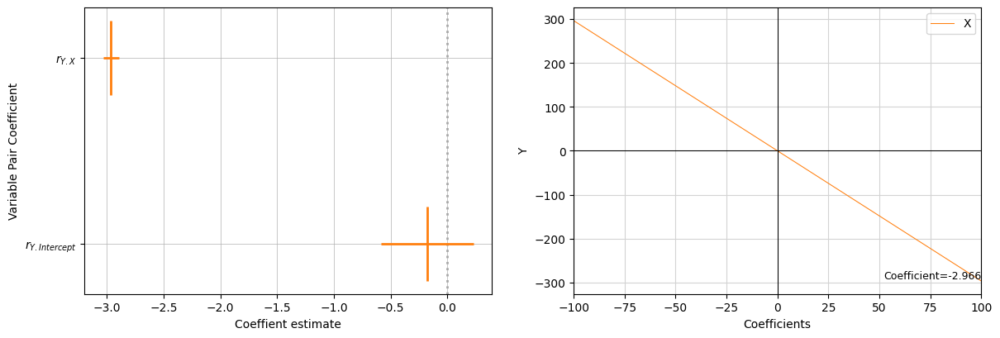

True


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      Y   R-squared:                       0.877
Model:                            OLS   Adj. R-squared:                  0.877
Method:                 Least Squares   F-statistic:                     7129.
Date:                Wed, 27 Dec 2023   Prob (F-statistic):               0.00
Time:                        17:44:28   Log-Likelihood:                -2022.9
No. Observations:                1000   AIC:                             4050.
Df Residuals:                     998   BIC:                             4060.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.1767      0.208     -0.850      0.396      -0.585       0.231
X             -2.9658      0.035    -84.431      0.000      -3.035      -2.897
==============================================================================
Omnibus:                        5.860   Durbin-Watson:                   1.963
Prob(Omnibus):                  0.053   Jarque-Bera (JB):                5.952
Skew:                          -0.185   Prob(JB):                       0.0510
Kurtosis:                       2.919   Cond. No.                         21.8
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [9]:
is_dependent_on, errors, ols_results = fork_causal_model.data.dependence(expression="Y ⫫̸ X", show_charts=True)
print(is_dependent_on)
ols_results.summary()

In [10]:
r_zx = fork_causal_model.edge_weightings[("X", "Z")]
r_yz = fork_causal_model.edge_weightings[("Z", "Y")]
r_yx = r_zx * r_yz

ols_change = ols_results.params["X"]

accuracy = calculate_percentage_accuracy(ols_change, r_yx)

print(f"The calculated value is {accuracy:.2%} accurate")

The calculated value is 98.86% accurate


ic| expression: 'Y ⫫̸ X | Z'


Y ~ X + Z


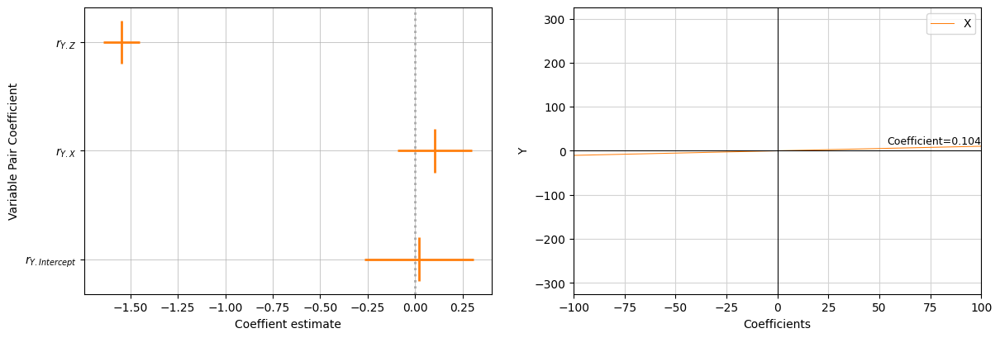

False


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      Y   R-squared:                       0.939
Model:                            OLS   Adj. R-squared:                  0.939
Method:                 Least Squares   F-statistic:                     7669.
Date:                Wed, 27 Dec 2023   Prob (F-statistic):               0.00
Time:                        17:44:28   Log-Likelihood:                -1673.3
No. Observations:                1000   AIC:                             3353.
Df Residuals:                     997   BIC:                             3367.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0205      0.147      0.140      0.889      -0.268       0.309
X              0.1035      0.100      1.038      0.300      -0.092       0.299
Z             -1.5482      0.049    -31.764      0.000      -1.644      -1.453
==============================================================================
Omnibus:                        0.665   Durbin-Watson:                   2.050
Prob(Omnibus):                  0.717   Jarque-Bera (JB):                0.536
Skew:                           0.008   Prob(JB):                        0.765
Kurtosis:                       3.112   Cond. No.                         48.6
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [11]:
is_dependent_on, errors, ols_results = fork_causal_model.data.dependence(expression="Y ⫫̸ X | Z", show_charts=True, ylim=(-325, 325), exclude_conditionals=True)
print(is_dependent_on)
ols_results.summary()

In [12]:
ols_results.pvalues["X"]

0.2997275348495016

ic| 'CausalModel.fit'
ic| expr_str: 'X = -2.5 x Z + ε'
ic| expr_str: 'Y = -3 x Z + ε'


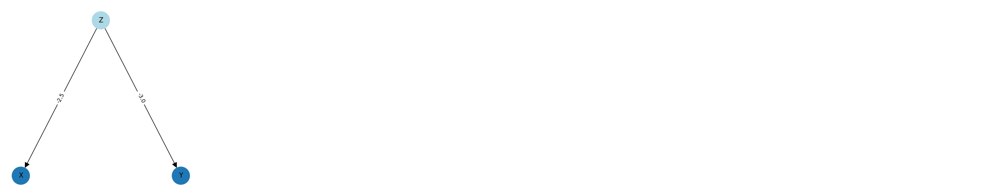

,Z,X,Y
0,8.152323,-21.969448,-24.417421
1,4.836658,-12.222028,-14.981507
2,8.557496,-20.631325,-25.728016
3,6.934193,-14.747129,-20.579592
4,5.524641,-13.221072,-15.837309
...,...,...,...
995,6.868654,-16.349010,-21.252302
996,4.503509,-11.098550,-12.610507
997,9.212545,-23.447524,-25.129828
998,7.111940,-18.023340,-20.362848


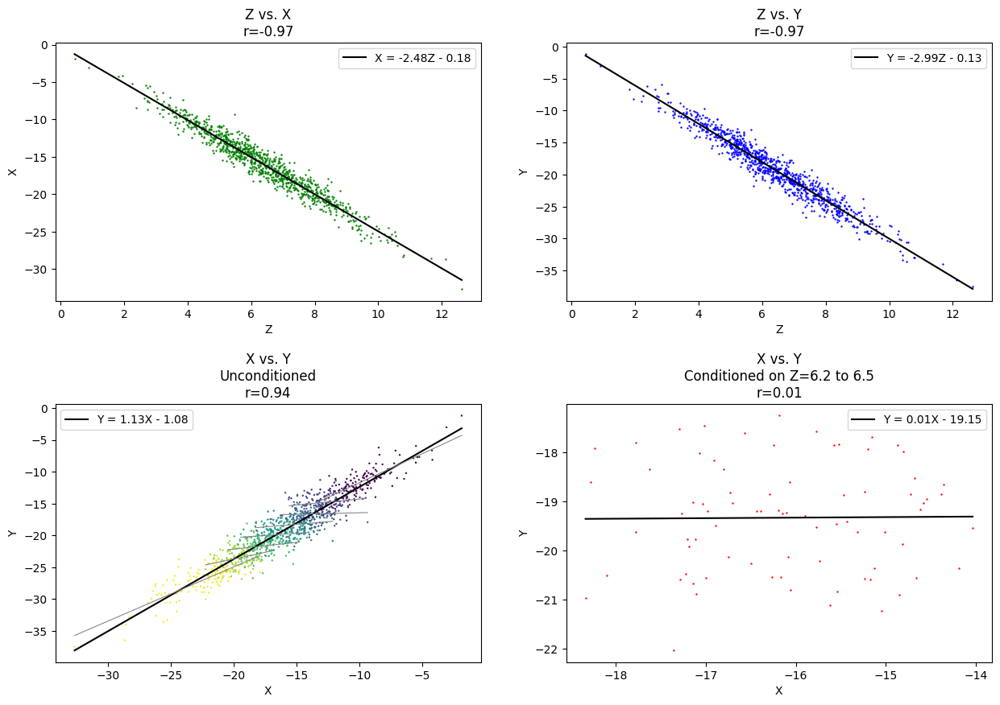

In [13]:
fork_causal_model = create_display_model("simple_fork")

In [14]:
fork_causal_model.structural_equations

{'Z': 'Z = np.random.normal(6.379134264424568, 1.6759869043722841)',
 'X': 'X = -2.5 x Z + ε',
 'Y': 'Y = -3 x Z + ε'}

ic| expression: 'Y ⫫̸ X'


Y ~ X


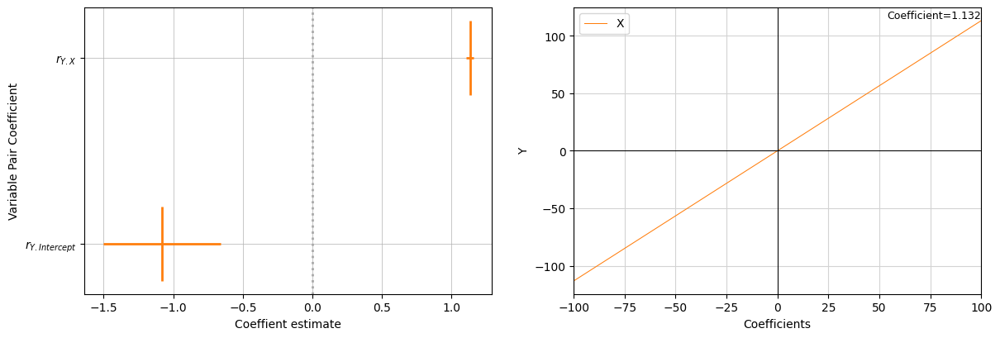

True


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      Y   R-squared:                       0.883
Model:                            OLS   Adj. R-squared:                  0.883
Method:                 Least Squares   F-statistic:                     7521.
Date:                Wed, 27 Dec 2023   Prob (F-statistic):               0.00
Time:                        17:44:29   Log-Likelihood:                -1969.6
No. Observations:                1000   AIC:                             3943.
Df Residuals:                     998   BIC:                             3953.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -1.0806      0.216     -5.005      0.000      -1.504      -0.657
X              1.1321      0.013     86.725      0.000       1.106       1.158
==============================================================================
Omnibus:                        1.803   Durbin-Watson:                   2.059
Prob(Omnibus):                  0.406   Jarque-Bera (JB):                1.788
Skew:                          -0.003   Prob(JB):                        0.409
Kurtosis:                       3.207   Cond. No.                         65.3
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [15]:
is_dependent_on, errors, ols_results = fork_causal_model.data.dependence(expression="Y ⫫̸ X", show_charts=True)
print(is_dependent_on)
ols_results.summary()

ic| expression: 'Y ⫫̸ X | Z'


Y ~ X + Z


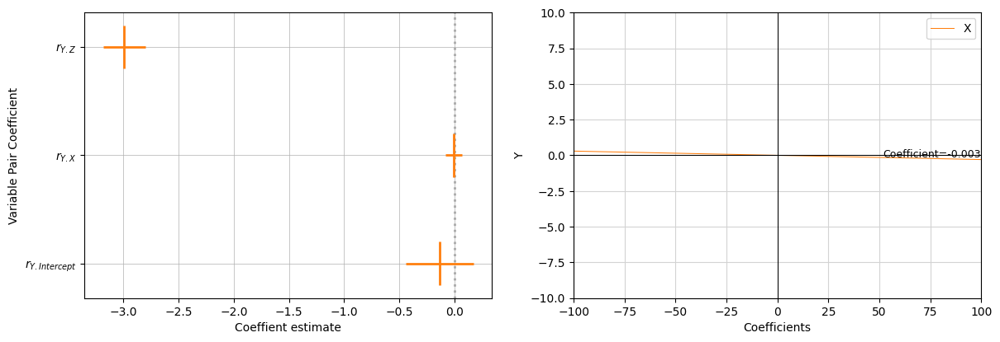

False


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      Y   R-squared:                       0.940
Model:                            OLS   Adj. R-squared:                  0.940
Method:                 Least Squares   F-statistic:                     7813.
Date:                Wed, 27 Dec 2023   Prob (F-statistic):               0.00
Time:                        17:44:29   Log-Likelihood:                -1634.9
No. Observations:                1000   AIC:                             3276.
Df Residuals:                     997   BIC:                             3290.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.1331      0.158     -0.844      0.399      -0.442       0.176
X             -0.0030      0.038     -0.078      0.938      -0.078       0.072
Z             -2.9949      0.097    -30.826      0.000      -3.186      -2.804
==============================================================================
Omnibus:                        4.516   Durbin-Watson:                   1.945
Prob(Omnibus):                  0.105   Jarque-Bera (JB):                4.393
Skew:                          -0.142   Prob(JB):                        0.111
Kurtosis:                       3.159   Cond. No.                         72.3
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [16]:
is_dependent_on, errors, ols_results = fork_causal_model.data.dependence(expression="Y ⫫̸ X | Z", show_charts=True, ylim=(-10, 10), exclude_conditionals=True)
print(is_dependent_on)
ols_results.summary()

ic| 'CausalModel.fit'
ic| expr_str: 'Z = 3 x X + 1.5 x Y + ε'


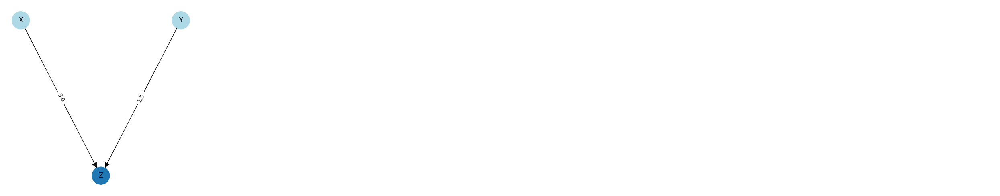

,X,Y,Z
0,5.339657,2.838914,21.699702
1,4.436386,4.209207,19.873020
2,3.614817,3.969693,16.604745
3,7.621657,2.334701,26.677919
4,5.394845,4.209831,22.699403
...,...,...,...
995,4.714531,5.520394,21.380471
996,6.112224,4.684789,25.868671
997,4.436417,3.379774,18.654721
998,3.839339,5.912388,18.680217


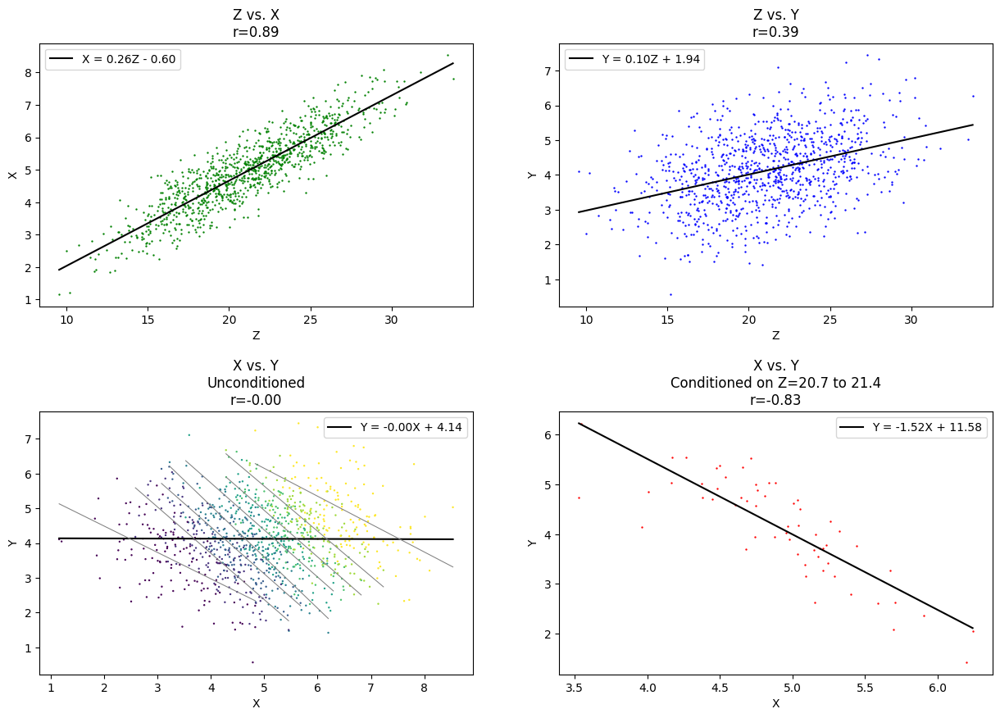

In [17]:
collider_causal_model = create_display_model("simple_collider")

ic| expression: 'Y ⫫̸ X'


Y ~ X


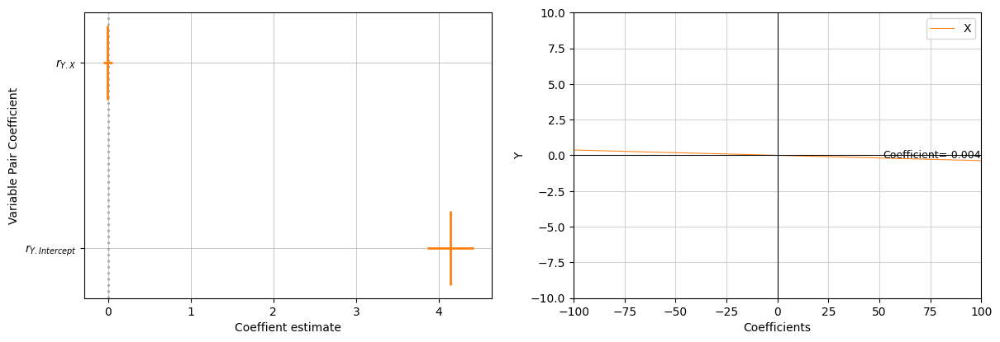

False


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      Y   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                   0.01734
Date:                Wed, 27 Dec 2023   Prob (F-statistic):              0.895
Time:                        17:44:30   Log-Likelihood:                -1451.3
No. Observations:                1000   AIC:                             2907.
Df Residuals:                     998   BIC:                             2916.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      4.1407      0.143     28.942      0.000       3.860       4.421
X             -0.0037      0.028     -0.132      0.895      -0.059       0.052
==============================================================================
Omnibus:                        0.045   Durbin-Watson:                   1.953
Prob(Omnibus):                  0.978   Jarque-Bera (JB):                0.029
Skew:                           0.013   Prob(JB):                        0.985
Kurtosis:                       3.001   Cond. No.                         23.0
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [18]:
is_dependent_on, errors, ols_results = collider_causal_model.data.dependence(expression="Y ⫫̸ X", show_charts=True, ylim=(-10, 10))
print(is_dependent_on)
ols_results.summary()

ic| expression: 'Y ⫫̸ X | Z'


Y ~ X + Z


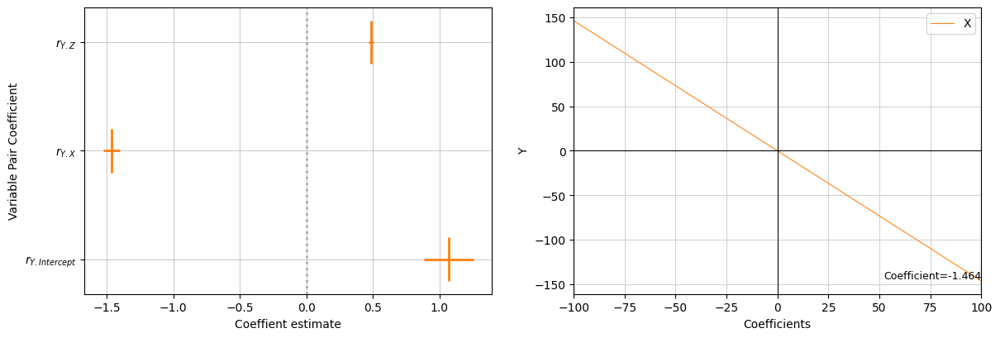

True


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      Y   R-squared:                       0.732
Model:                            OLS   Adj. R-squared:                  0.732
Method:                 Least Squares   F-statistic:                     1364.
Date:                Wed, 27 Dec 2023   Prob (F-statistic):          4.38e-286
Time:                        17:44:30   Log-Likelihood:                -792.23
No. Observations:                1000   AIC:                             1590.
Df Residuals:                     997   BIC:                             1605.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      1.0706      0.095     11.323      0.000       0.885       1.256
X             -1.4643      0.032    -46.426      0.000      -1.526      -1.402
Z              0.4883      0.009     52.230      0.000       0.470       0.507
==============================================================================
Omnibus:                        0.560   Durbin-Watson:                   1.974
Prob(Omnibus):                  0.756   Jarque-Bera (JB):                0.570
Skew:                          -0.058   Prob(JB):                        0.752
Kurtosis:                       2.979   Cond. No.                         124.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [19]:
is_dependent_on, errors, ols_results = collider_causal_model.data.dependence(expression="Y ⫫̸ X | Z", show_charts=True, exclude_conditionals=True)
print(is_dependent_on)
ols_results.summary()

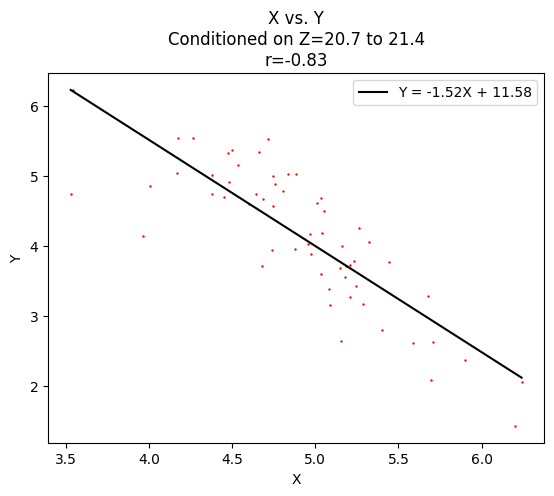

In [20]:
df_conditioned = collider_causal_model.data.scatter_conditioned(X="X", Y="Y", conditioned_on="Z")

In [21]:
ols_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      Y   R-squared:                       0.732
Model:                            OLS   Adj. R-squared:                  0.732
Method:                 Least Squares   F-statistic:                     1364.
Date:                Wed, 27 Dec 2023   Prob (F-statistic):          4.38e-286
Time:                        17:44:30   Log-Likelihood:                -792.23
No. Observations:                1000   AIC:                             1590.
Df Residuals:                     997   BIC:                             1605.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      1.0706      0.095     11.323      0.000       0.885       1.256
X             -1.4643      0.032    -46.426      0.000      -1.526      -1.402
Z              0.4883      0.009     52.230      0.000       0.470       0.507
==============================================================================
Omnibus:                        0.560   Durbin-Watson:                   1.974
Prob(Omnibus):                  0.756   Jarque-Bera (JB):                0.570
Skew:                          -0.058   Prob(JB):                        0.752
Kurtosis:                       2.979   Cond. No.                         124.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [22]:
ols_results.params["X"]

-1.4642644239470703

In [23]:
r_zx = collider_causal_model.edge_weightings[("X", "Z")]
r_zy = collider_causal_model.edge_weightings[("Y", "Z")]

Z = 

3.0

In [24]:
total = 0
X_mult = -3
divisor = 1.5
for index, row in df_conditioned.iterrows():

    r_zx = collider_causal_model.edge_weightings[("X", "Z")]
    r_zy = collider_causal_model.edge_weightings[("Y", "Z")]
    Z = df_conditioned["Z"]

    
    print(df_conditioned["Z"])
    #total+= (row["Z"] + (X_mult * row["X"])) / divisor
    
#print(total / index+1)

22     21.118050
25     21.286314
34     21.150212
37     21.392634
43     21.391986
128    20.878840
167    21.193889
186    20.836404
197    20.917597
216    21.281235
229    20.879112
240    20.992228
261    20.945583
270    21.247694
289    20.870470
311    21.100607
334    21.264444
349    21.348533
394    20.757580
397    20.992018
401    21.089993
408    20.900156
422    21.294682
470    20.949563
477    20.774600
488    21.097147
494    21.190012
537    21.036480
545    20.941731
569    20.789115
575    21.202588
595    21.161290
616    21.428928
631    21.291731
641    20.704091
644    21.244814
651    21.162101
686    20.822503
690    21.123931
698    20.783530
700    20.851681
716    21.046139
739    20.954271
747    21.203515
781    20.858381
783    21.047903
794    20.999102
858    20.965724
862    20.761921
886    21.121259
893    21.188747
898    21.416596
901    20.817190
936    21.289695
942    21.118016
958    21.061018
960    20.726384
995    21.380471
999    21.0690

In [25]:
# Z = 3 x X + 1.5 x Y + 

In [26]:
3 * df_conditioned.loc[22, "X"] + 1.5 * df_conditioned.loc[22, "Y"]

21.989602174198502

In [27]:
df_conditioned["Z"].mean()

21.06290657039535

In [28]:
df_conditioned["Y"].mean()

4.125204767786311

In [29]:
((df_conditioned["Z"].mean()) - (3 * df_conditioned["X"].mean())) / 1.5

4.214381311200946

In [30]:
((df_conditioned.loc[34, "Z"]) - (3 * df_conditioned.loc[34, "X"])) / 1.5

5.347156623310483

In [31]:
df_conditioned["Z"].mean()

21.06290657039535

In [32]:
df_conditioned

,X,Y,Z
22,4.658881,5.341972,21.118050
25,5.148078,3.679727,21.286314
34,4.376492,5.009038,21.150212
37,5.085197,3.377897,21.392634
43,5.007614,4.611831,21.391986
128,3.541691,6.222858,20.878840
167,4.953625,4.025484,21.193889
186,4.681047,3.702579,20.836404
197,4.642835,4.735673,20.917597
216,4.537593,5.147951,21.281235


In [33]:
(df_conditioned["Y"] / df_conditioned["X"]).mean()

0.8691104398537419

In [34]:
def test_chain(n_tests: int = 100):
    ic.disable()
    chain_tests_passed = 0
    accuracies = []

    for _ in range(n_tests):
        chain_causal_model = create_display_model("simple_chain", display_results=False)

        is_dependent_on_conditioned, _, ols_results = chain_causal_model.data.dependence(expression="Y ⫫̸ X | Z")
        is_dependent_on_unconditioned, _, ols_results = chain_causal_model.data.dependence(expression="Y ⫫̸ X")

        if (is_dependent_on_unconditioned == True) and (is_dependent_on_conditioned == False):
            chain_tests_passed += 1
#        else:
#            print(chain_causal_model.structural_equations)

            r_zx = chain_causal_model.edge_weightings[("X", "Z")]
            r_yz = chain_causal_model.edge_weightings[("Z", "Y")]
            r_yx = r_zx * r_yz

            ols_change = ols_results.params["X"]

            accuracies.append(calculate_percentage_accuracy(ols_change, r_yx))

    print(f"Chain tests: {chain_tests_passed}/{n_tests} passed ({chain_tests_passed/n_tests:.1%})")
    print(f"The calculated effect of X on Y is {np.mean(np.array(accuracies)):.1%} accurate")

    ic.enable()

    return

In [35]:
test_chain(100)

Chain tests: 93/100 passed (93.0%)
The calculated effect of X on Y is 99.2% accurate


In [36]:
def test_fork(n_tests: int = 100):
    ic.disable()
    fork_tests_passed = 0
    accuracies = []

    for _ in range(n_tests):
        fork_causal_model = create_display_model("simple_fork", display_results=False)

        is_dependent_on_conditioned, _, ols_results = fork_causal_model.data.dependence(expression="Y ⫫̸ X | Z")
        is_dependent_on_unconditioned, _, ols_results = fork_causal_model.data.dependence(expression="Y ⫫̸ X")

        if (is_dependent_on_unconditioned == True) and (is_dependent_on_conditioned == False):
            fork_tests_passed += 1

            r_xz = fork_causal_model.edge_weightings[("Z", "X")]
            r_yz = fork_causal_model.edge_weightings[("Z", "Y")]
            
            r_yx = (1 / r_xz) * r_yz

            ols_change = ols_results.params["X"]

            accuracies.append(calculate_percentage_accuracy(ols_change, r_yx))

    print(f"Fork tests: {fork_tests_passed}/{n_tests} passed ({fork_tests_passed/n_tests:.1%})")
    print(f"The calculated effect of X on Y is {np.mean(np.array(accuracies)):.1%} accurate")

    ic.enable()

    return

In [37]:
test_fork(n_tests=100)

Fork tests: 92/100 passed (92.0%)
The calculated effect of X on Y is 94.3% accurate


In [38]:
collider_causal_model.edge_weightings[("X", "Z")]

3.0

In [39]:
collider_causal_model.edge_weightings[("Y", "Z")]

1.5

ic| 'CausalModel.fit'
ic| expr_str: 'Z = -1.5 x X + 1.5 x Y + ε'


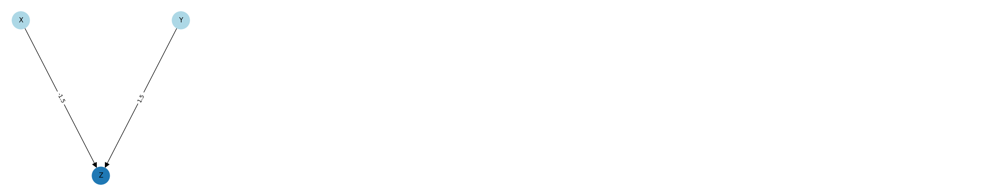

,X,Y,Z
0,4.506798,6.024615,2.222867
1,5.931630,8.027033,3.766145
2,2.851881,11.752819,13.273405
3,1.550860,6.791992,8.453673
4,6.389107,9.275463,3.939647
...,...,...,...
995,8.953772,10.703608,3.239352
996,6.523353,9.735763,3.874244
997,3.646470,8.762128,7.829303
998,4.787296,7.992393,5.324467


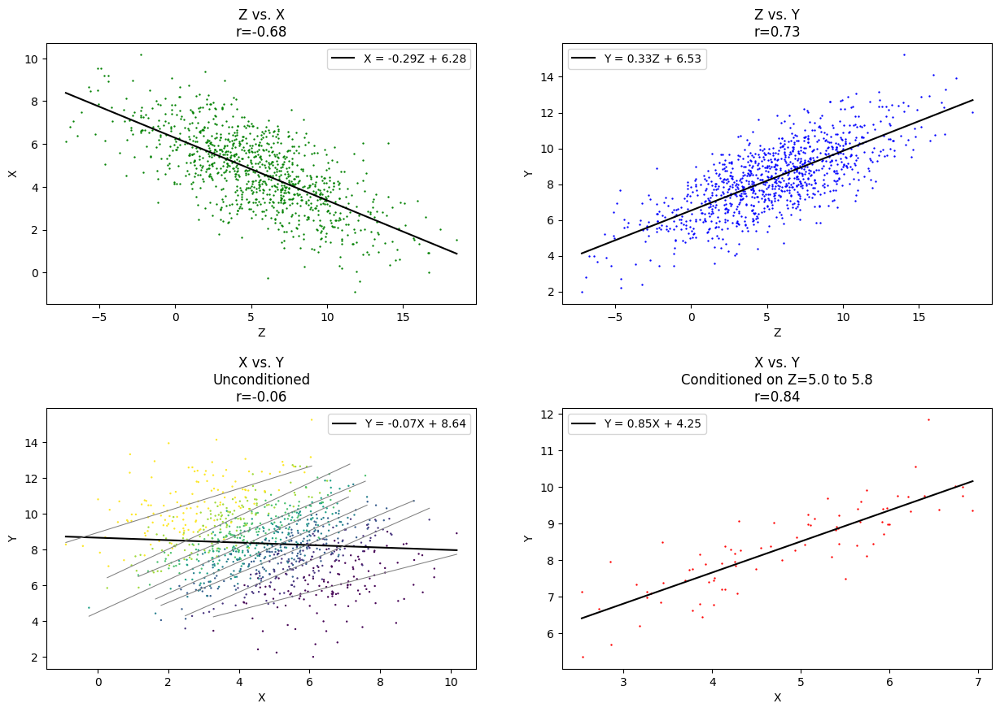

ic| expression: 'Y ⫫̸ X | Z'


0.866293619744964

In [40]:
collider_causal_model = create_display_model("simple_collider", display_results=True)

is_dependent_on_conditioned, _, ols_results = collider_causal_model.data.dependence(expression="Y ⫫̸ X | Z")

ols_change = ols_results.params["X"]
ols_change

In [41]:
collider_causal_model.data["Z"].mean() / 1.5

3.5907347878975258